In [1]:
import torch
import numpy as np
from PIL import Image
import torchvision.transforms as T
from tqdm import tqdm
import pandas as pd
import os

In [2]:
metadata = pd.read_csv("data/streetview_v3/metadatav3.csv")
metadata.path = metadata.path.apply(lambda x: x.split("/")[-1])
metadata.head()

,path,latitude,longitude,iso_alpha2,address
0,0.jpeg,48.371059,19.416553,SK,"050103, Šuľa, Slovakia"
1,1.jpeg,48.371059,19.416553,SK,"050103, Šuľa, Slovakia"
2,2.jpeg,48.371059,19.416553,SK,"050103, Šuľa, Slovakia"
3,3.jpeg,48.432054,19.642330,SK,"050112, 985 22 Cinobaňa, Slovakia"
4,4.jpeg,48.432054,19.642330,SK,"050112, 985 22 Cinobaňa, Slovakia"


In [30]:
# model = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitb14').to("cuda")
model = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14').to("cuda")
model.eval()
# model = torch.compile(model)
model

Using cache found in /home/manuel/.cache/torch/hub/facebookresearch_dinov2_main


DinoVisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 384, kernel_size=(14, 14), stride=(14, 14))
    (norm): Identity()
  )
  (blocks): ModuleList(
    (0-11): 12 x NestedTensorBlock(
      (norm1): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (attn): MemEffAttention(
        (qkv): Linear(in_features=384, out_features=1152, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=384, out_features=384, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): LayerScale()
      (drop_path1): Identity()
      (norm2): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=384, out_features=1536, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=1536, out_features=384, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
      (ls2): LayerScale()
      (drop_path2): Identity()
    )
  )
  (n

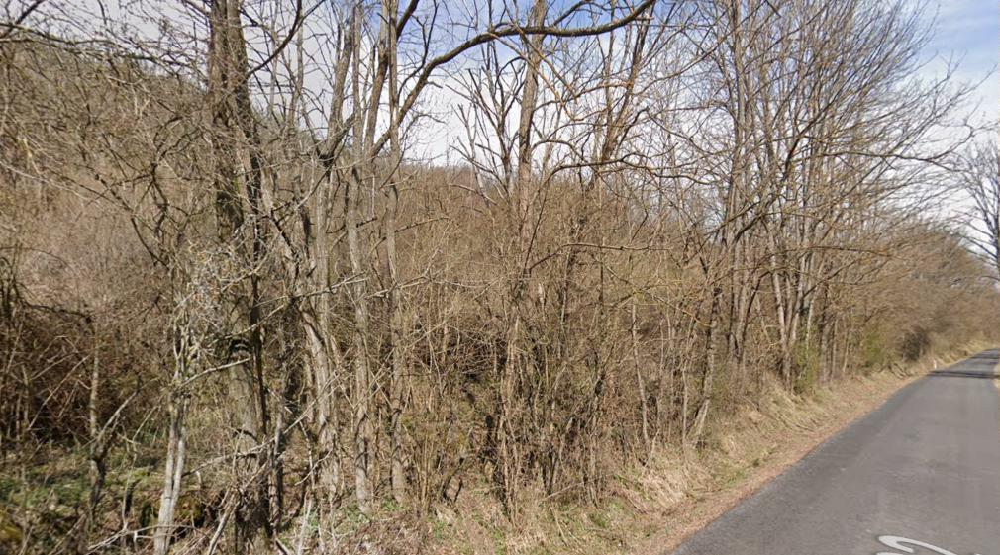

In [3]:
PATH = "data/streetview_v3/images/"
PATH_TEST = "data/test-competition/images/images/"
img = Image.open(PATH + "0.jpeg")
img

In [4]:
IMAGENET_DEFAULT_MEAN = (0.485, 0.456, 0.406)
IMAGENET_DEFAULT_STD = (0.229, 0.224, 0.225)

In [5]:
# Create dataloader
import pandas as pd
import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

transform = T.Compose([
T.Resize(256, interpolation=T.InterpolationMode.BICUBIC),
T.CenterCrop(224),
T.ToTensor(),
T.Normalize(mean=IMAGENET_DEFAULT_MEAN, std=IMAGENET_DEFAULT_STD),
])

class CustomImageDataset(Dataset):
    def __init__(self, img_files, img_dir, transform=None):
        self.img_dir = img_dir
        self.img_files = img_files
        self.transform = transform

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_files[idx])
        image = Image.open(img_path)
        if self.transform:
            image = self.transform(image)[:3]
        return image

In [7]:
files = os.listdir(PATH)
# files = sorted(files, key=lambda x: int(x.split(".")[0]))
print(f"Found {len(files)} files")
training_data = CustomImageDataset(files, PATH, transform=transform)
train_dataloader = DataLoader(training_data, batch_size=256, shuffle=False, num_workers=8, pin_memory=True)

# Store all embeddings in a list
embeddings = []
for batch in tqdm(train_dataloader):
    with torch.no_grad():
        features = model(batch.to("cuda")).cpu()
        embeddings.append(features)
embeddings = torch.cat(embeddings, dim=0).cpu().numpy()
print(embeddings.shape)
# Save as .npy
np.save("data/embeddings.npy", embeddings)
with open("data/files.txt", "w") as f:
    f.write("\n".join(files))

Found 130779 files


100%|██████████| 511/511 [1:15:30<00:00,  8.87s/it]


(130779, 384)


In [8]:
# Simpler loop for the Lolz
test_embeddings = []
test_files = os.listdir(PATH_TEST)
for test_file in tqdm(test_files):
    img = Image.open(PATH_TEST + test_file)
    with torch.no_grad():
        features = model(transform(img).to("cuda")[:3].unsqueeze(0))[0].cpu()
        test_embeddings.append(features)

test_embeddings = torch.stack(test_embeddings).cpu().numpy()
np.save("data/test_embeddings.npy", test_embeddings)
with open("data/test_files.txt", "w") as f:
    f.write("\n".join(test_files))

100%|██████████| 2735/2735 [02:53<00:00, 15.72it/s]


In [6]:
embeddings = np.load("data/embeddings.npy")
test_embeddings = np.load("data/test_embeddings.npy")
files = open("data/files.txt").read().split("\n")
test_files = open("data/test_files.txt").read().split("\n")
embeddings.shape, test_embeddings.shape, len(files), len(test_files)

((130779, 384), (2735, 384), 130779, 2735)

In [7]:
# KNN
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from geom_median.numpy import compute_geometric_median

In [8]:
# knn = NearestNeighbors(n_neighbors=20, metric="cosine")
knn = NearestNeighbors(n_neighbors=50, algorithm='kd_tree', n_jobs=8)
knn.fit(embeddings)

NearestNeighbors(algorithm='kd_tree', n_jobs=8, n_neighbors=50)

In [9]:
def cluster(df, eps=0.1, min_samples=5, metric="cosine", n_jobs=8, show=False):
    if len(df) == 1:
        return df
    dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric=metric, n_jobs=n_jobs)
    dbscan.fit(df[["longitude", "latitude"]])
    df["cluster"] = dbscan.labels_
    # Return centroid of the cluster with the most points
    df = df[df.cluster == df.cluster.value_counts().index[0]]
    if show:
        display(df)
    df = df.groupby("cluster").apply(lambda x: x[["longitude", "latitude"]].median()).reset_index()
    # Return coordinates of the cluster with the most points
    return df.longitude.iloc[0], df.latitude.iloc[0]

In [10]:
# Validation
thresh = 100
_, val_neighbors = knn.kneighbors(embeddings[:thresh])

df_agg = None
for i in range(len(val_neighbors[0])):
    df = pd.DataFrame()
    df["image_id"] = files[:thresh]
    df.image_id = df.image_id.apply(lambda x: x.split(".")[0])
    df["neighbor_idx"] = val_neighbors[:, i]
    df.neighbor_idx = df.neighbor_idx.apply(lambda x: int(files[x].split(".")[0]))
    df = df.merge(metadata, left_on="neighbor_idx", right_index=True)
    df_agg = pd.concat([df_agg, df])
# df_agg = df_agg.reset_index(drop=True)[["image_id", "longitude", "latitude"]].groupby("image_id").median().reset_index()

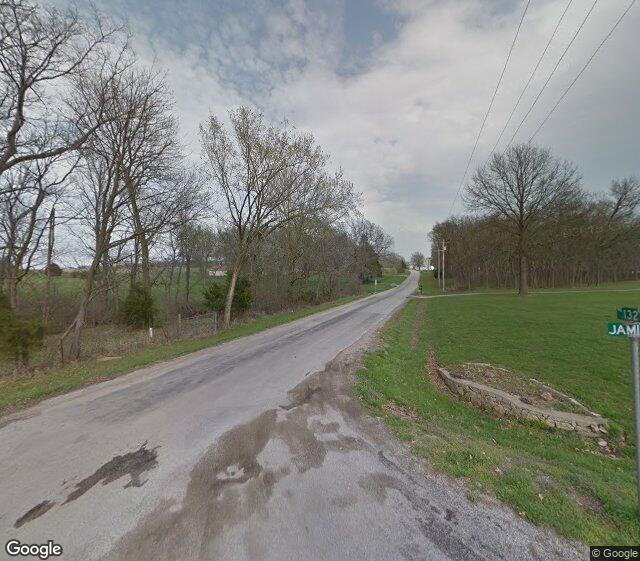

/tmp/ipykernel_42933/2462962030.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["cluster"] = dbscan.labels_


image_id             51327
neighbor_idx         51327
path            51327.jpeg
latitude         39.341518
longitude       -94.520573
iso_alpha2              US
address                NaN
Name: 67, dtype: object


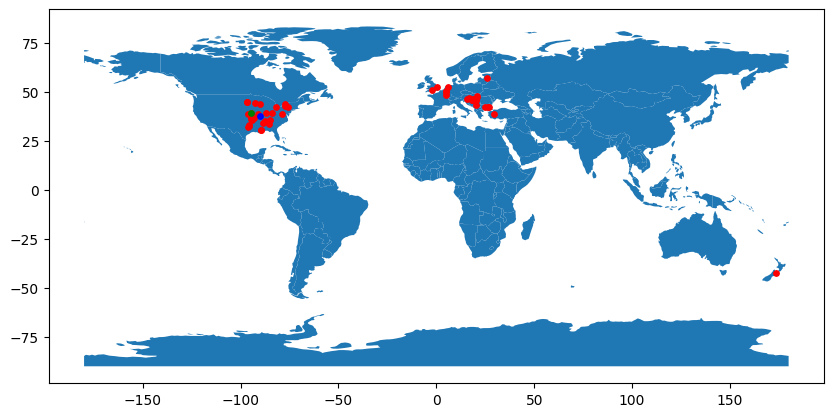

In [12]:
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame

idx = 67
df = df_agg[df_agg.image_id == df_agg.image_id.iloc[idx]]

display(Image.open(PATH + df_agg.image_id.iloc[idx] + ".jpeg"))

geometry = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
gdf = GeoDataFrame(df, geometry=geometry)
df_gt = df[:1]
gdf_gt = GeoDataFrame(df_gt, geometry=[Point(xy) for xy in zip(df_gt['longitude'], df_gt['latitude'])])

guess_pt = Point(cluster(df[1:]))
gdf_guess = GeoDataFrame(df_gt, geometry=[guess_pt])

print(df.iloc[0])
#this is a simple map that goes with geopandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
plot_ = world.plot(figsize=(10, 6))
gdf.plot(ax=plot_, marker='o', color='red', markersize=15)
gdf_guess.plot(ax=plot_, marker='o', color='blue', markersize=15);
gdf_gt.plot(ax=plot_, marker='o', color='green', markersize=15);

In [13]:
# Test
distances, neighbors = knn.kneighbors(test_embeddings)

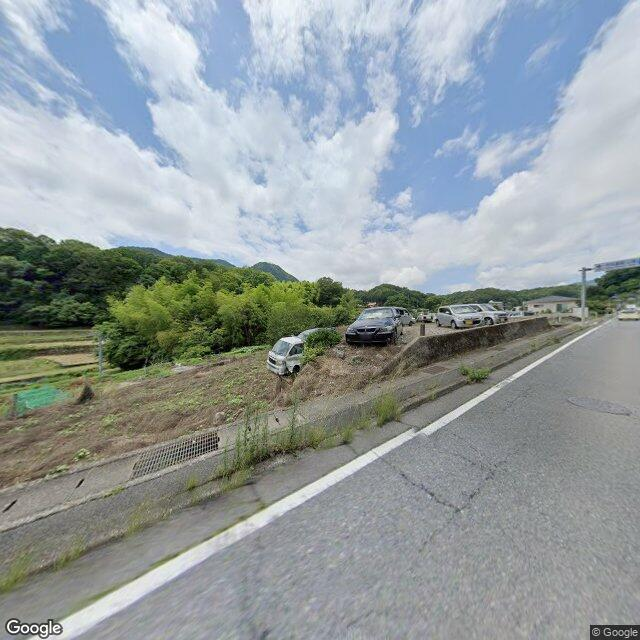

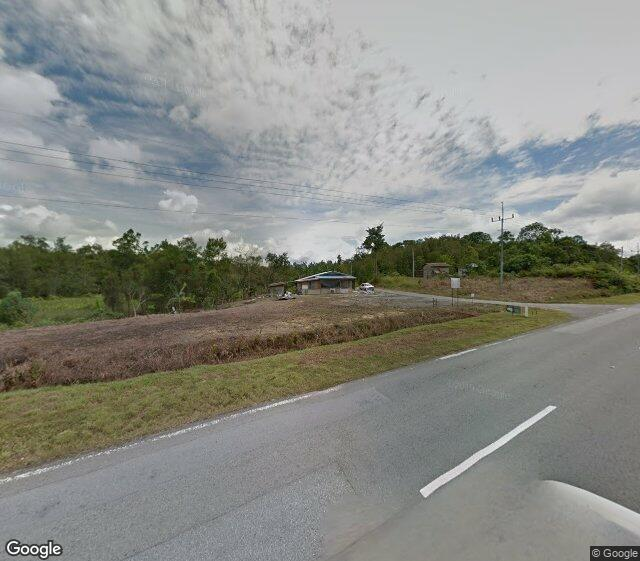

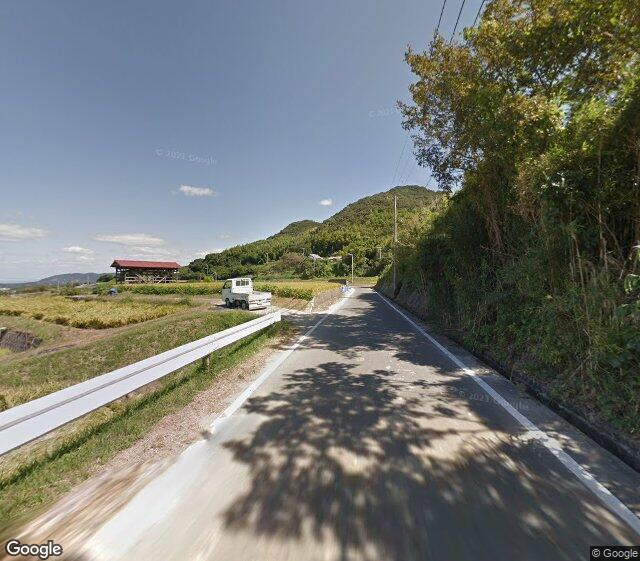

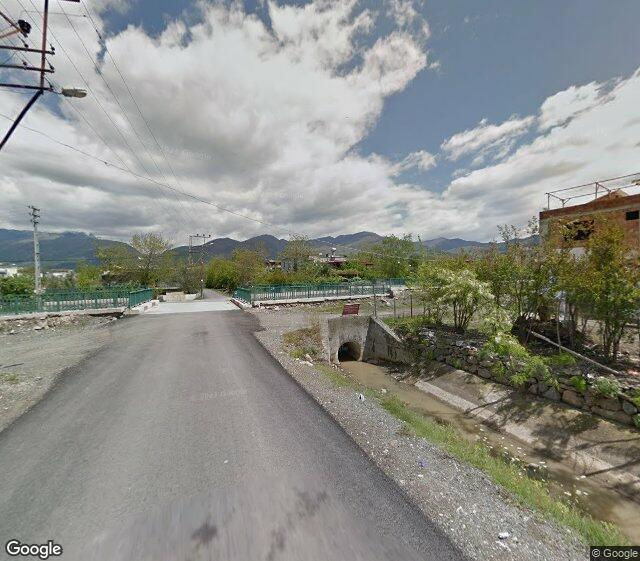

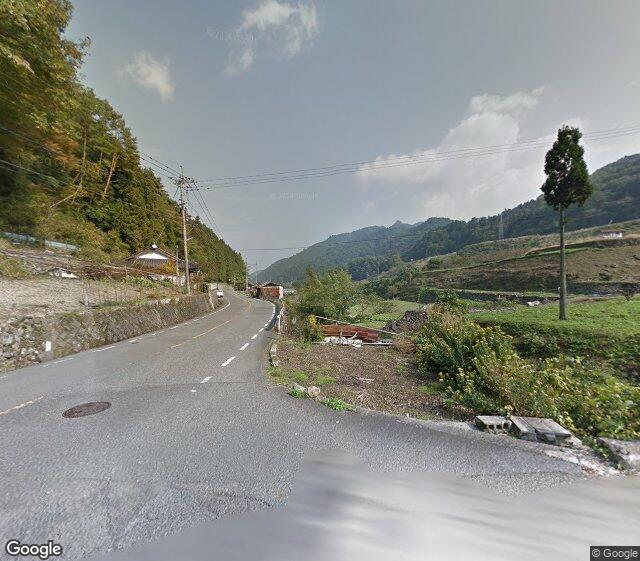

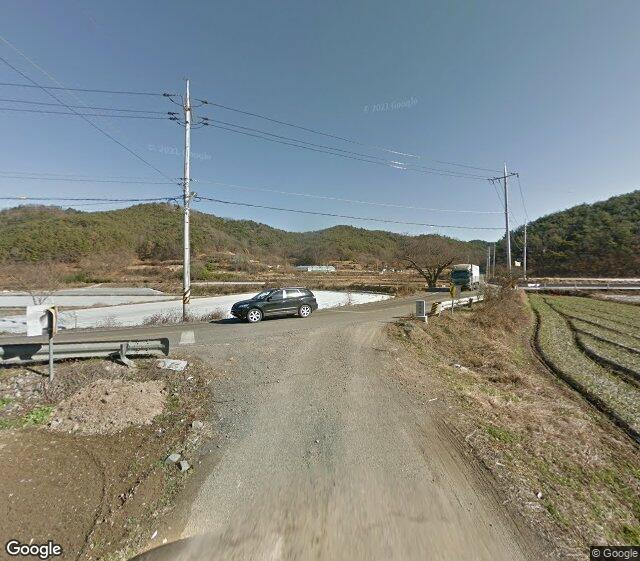

,path,latitude,longitude,iso_alpha2,address
0,63588.jpeg,1.495465,109.937779,MY,NaN
1,89997.jpeg,34.434319,134.831443,JP,NaN
2,104740.jpeg,37.248916,36.448181,TR,NaN
3,90098.jpeg,34.515922,132.181874,JP,NaN
4,94618.jpeg,35.431882,128.439042,KR,NaN


In [14]:
test_idx = 0
rec = []
display(Image.open(PATH_TEST + test_files[test_idx]))
for idx in neighbors[test_idx][:5]:
    display(Image.open(PATH + files[idx]))
    rec.append(metadata[metadata.path == files[idx]].to_dict("records")[0])
pd.DataFrame.from_dict(rec)

In [15]:
df = pd.DataFrame()
df["image_id"] = test_files
df.image_id = df.image_id.apply(lambda x: x.split(".")[0])
df["neighbor_idx"] = neighbors[:, 0]
df.neighbor_idx = df.neighbor_idx.apply(lambda x: int(files[x].split(".")[0]))
df = df.merge(metadata, left_on="neighbor_idx", right_index=True)
df[['image_id', 'latitude', 'longitude']].to_csv("submission.csv", index=False)
df

,image_id,neighbor_idx,path,latitude,longitude,iso_alpha2,address
0,4ac45556d6e0,63588,63588.jpeg,1.495465,109.937779,MY,NaN
1,4bb9da9c291a,40086,40086.jpeg,-6.204786,-78.862121,PE,NaN
2,aea49f528881,40769,40769.jpeg,9.241469,99.730714,TH,NaN
3,d684fa3e6030,72895,72895.jpeg,64.823433,26.022044,FI,NaN
4,129ec1e75dc5,106646,106646.jpeg,6.570323,-2.154392,GH,NaN
...,...,...,...,...,...,...,...
2729,a69f89da6a2e,107872,107872.jpeg,7.683346,80.053492,LK,NaN
2730,3a31be5e7309,49817,49817.jpeg,5.482455,7.438241,NG,NaN
2731,54017ab3c55c,115710,115710.jpeg,51.323811,21.175295,PL,NaN
2732,a87969ff41ff,124452,124452.jpeg,48.641905,21.772771,SK,NaN


In [19]:
df_agg = None
for i in range(len(neighbors[0])):
    df = pd.DataFrame()
    df["image_id"] = test_files
    df.image_id = df.image_id.apply(lambda x: x.split(".")[0])
    df["neighbor_idx"] = neighbors[:, i]
    df["neighbor_distance"] = distances[:, i]
    df.neighbor_idx = df.neighbor_idx.apply(lambda x: int(files[x].split(".")[0]))
    df = df.merge(metadata, left_on="neighbor_idx", right_index=True)
    df_agg = pd.concat([df_agg, df])

df_agg["weight"] = df_agg.neighbor_distance.apply(lambda x: 1 / x)
# df_agg = df_agg.reset_index(drop=True)[["image_id", "longitude", "latitude"]].groupby("image_id").median().reset_index()
# df_agg[['image_id', 'longitude', 'latitude']].to_csv("submission.csv", index=False)

# df_agg

In [20]:
# df_agg = df_agg.reset_index(drop=True)[["image_id", "longitude", "latitude", "weight"]].groupby("image_id").apply(lambda x: compute_geometric_median(x[["longitude", "latitude"]].values, weights=x["weight"]).median).reset_index()

df_agg = df_agg.reset_index(drop=True)[["image_id", "longitude", "latitude", "weight"]].groupby("image_id").apply(lambda x: cluster(x, eps=0.005, min_samples=5)).reset_index()

df_agg["longitude"] = df_agg[0].apply(lambda x: x[0])
df_agg["latitude"] = df_agg[0].apply(lambda x: x[1])
df_agg.drop(0, axis=1, inplace=True)
df_agg[['image_id', 'latitude', 'longitude']].to_csv("submission.csv", index=False)
df_agg

,image_id,longitude,latitude
0,002afb28ad87,-87.524060,45.129360
1,00338feb65b9,90.933421,22.674425
2,003ce040e761,-56.829502,-31.788250
3,0054136a5be4,39.675683,-0.844824
4,005bfb803115,-53.587224,-26.904200
...,...,...,...
2730,ff973c914d4d,14.638618,43.724787
2731,ff97ce5bfa61,24.699303,56.142616
2732,ffafd16c1acb,-79.241781,-0.378827
2733,ffda2c6a8306,9.398968,18.913245


In [18]:
# Viz
df_agg = None
for i in range(len(neighbors[0])):
    df = pd.DataFrame()
    df["image_id"] = test_files
    df.image_id = df.image_id.apply(lambda x: x.split(".")[0])
    df["neighbor_idx"] = neighbors[:, i]
    df["neighbor_distance"] = distances[:, i]
    df.neighbor_idx = df.neighbor_idx.apply(lambda x: int(files[x].split(".")[0]))
    df = df.merge(metadata, left_on="neighbor_idx", right_index=True)
    df_agg = pd.concat([df_agg, df])

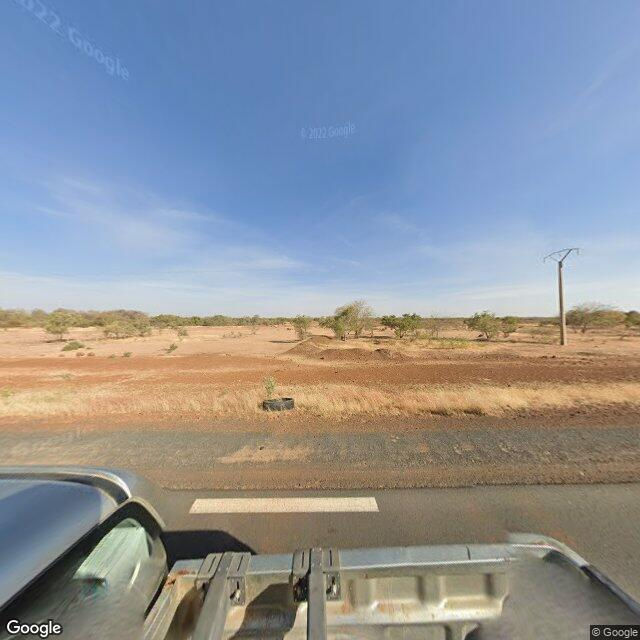

/tmp/ipykernel_6484/2462962030.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["cluster"] = dbscan.labels_


image_id             0054136a5be4
neighbor_idx                86193
neighbor_distance       27.987584
path                   86193.jpeg
latitude                -0.854044
longitude               39.708109
iso_alpha2                     KE
address                       NaN
cluster                         0
Name: 20, dtype: object


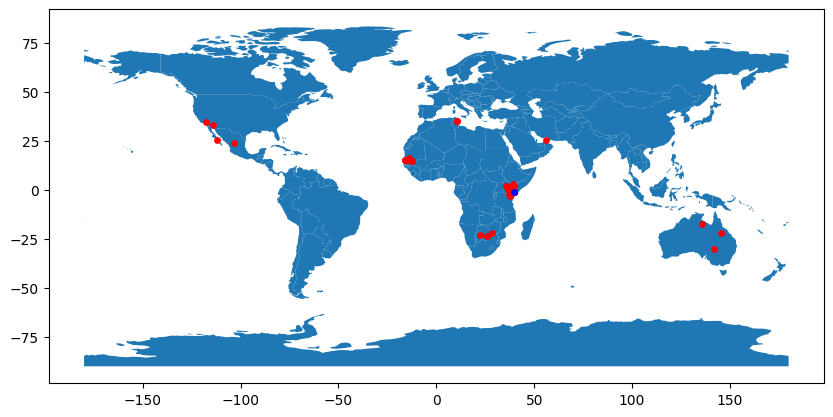

In [28]:
idx = 20
name = test_files[idx].split(".")[0]
df = df_agg[df_agg.image_id == name]

display(Image.open(PATH_TEST + name + ".png"))

geometry = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
gdf = GeoDataFrame(df, geometry=geometry)
gdf_guess = GeoDataFrame(df_gt, geometry=[Point(cluster(df, eps=0.005, min_samples=3))])

print(df.iloc[0])
#this is a simple map that goes with geopandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
plot_ = world.plot(figsize=(10, 6))
gdf.plot(ax=plot_, marker='o', color='red', markersize=15)
gdf_guess.plot(ax=plot_, marker='o', color='blue', markersize=15);


In [64]:
def guess_image(image_path, show=False):
    img = Image.open(image_path)
    # cast as rgb
    img = img.convert('RGB')
    print(img)
    with torch.no_grad():
        features = model(transform(img).to("cuda").unsqueeze(0))[0].cpu()
        distances, neighbors = knn.kneighbors(features.unsqueeze(0))

    neighbors = neighbors[0]
    # Return metadata df rows with neighbors
    df = pd.DataFrame()
    for n in neighbors:
        df = pd.concat([df, metadata[metadata.path == files[n]]])
    coords = cluster(df, eps=0.005, min_samples=5)

    if show:
        display(img)
        geometry = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
        gdf = GeoDataFrame(df, geometry=geometry)
        gdf_guess = GeoDataFrame(df_gt, geometry=[Point(coords)])
            #this is a simple map that goes with geopandas
        world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
        plot_ = world.plot(figsize=(10, 6))
        gdf.plot(ax=plot_, marker='o', color='red', markersize=15)
        gdf_guess.plot(ax=plot_, marker='o', color='blue', markersize=15);
        # display(plot_)
    return coords

<PIL.Image.Image image mode=RGB size=2422x1817 at 0x7F64F05A9CD0>


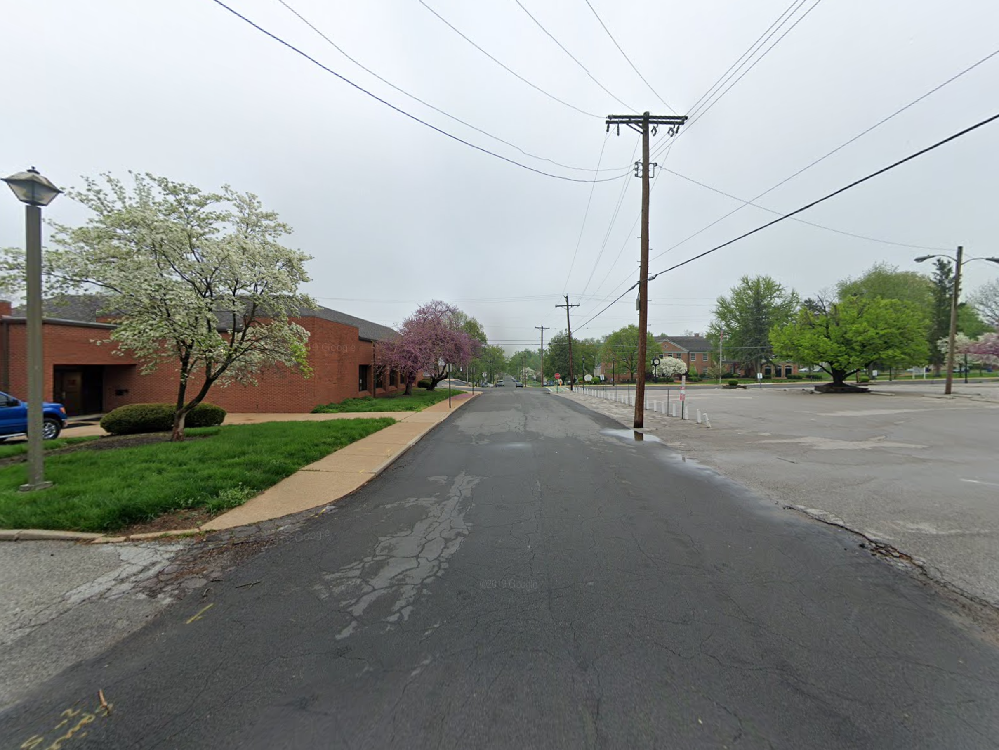

(-85.83300726688488, 38.1244593)

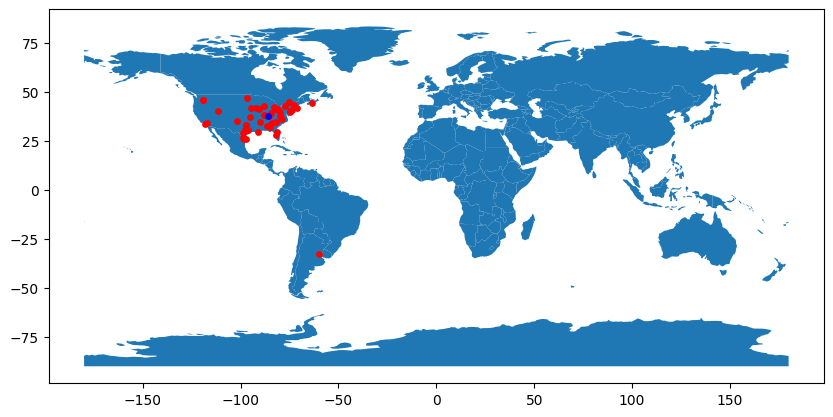

In [76]:
# guess_image(PATH_TEST + test_files[89], show=True)
guess_image("/home/manuel/Pictures/Screenshots/Screenshot from 2023-05-01 15-55-37.png", show=True)